In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd

from matplotlib import rc, font_manager
ticks_font = font_manager.FontProperties(family='serif', style='normal',
                                         size=24, weight='normal', stretch='normal')
import ternary
import os
import json

from sspredict.make_prediction.ternary_calc_wrapper import ternary_calc_strength
from sspredict.make_prediction.property_plotter import pyss_plotter_3d

In [2]:
# Initialization
# BCC_screw_Maresca-Curtin-2019
ternary_calc = ternary_calc_strength()
ternary_calc.ssmodels_all

['FCC_Varvenne-Curtin-2016',
 'BCC_edge_Maresca-Curtin-2019',
 'BCC_screw_Maresca-Curtin-2019',
 'BCC_screw_Suzuki_RWASM-2020']

In [3]:
alloy_system = {
            "increment": 1,
            "psA": {"grouped_elements":["Nb"],
                    "ratio": [1],
                    "range":[0,100]},
            "psB": {"grouped_elements":["Mo"],
                    "ratio": [1],
                    "range":[0,100]},
            "psC": {"grouped_elements":["W"],
                    "ratio": [1], 
                    "range":[0,100]} # 0 to 100 at.%
        }
ternary_calc.set_comp_mesh(alloy_system)

Alloy system: Nb Mo W 
Ternary composition grid generated: 
Vertex: A; Vertex Element: Nb; Composition range: 0-100 at.%
Vertex: B; Vertex Element: Mo; Composition range: 0-100 at.%
Vertex: C; Vertex Element: W; Composition range: 0-100 at.%


In [4]:
ternary_calc.use_model('BCC_screw_Maresca-Curtin-2019')
# specify the adjustable parameters for the model 
ternary_calc.set_adjustables()

Currently using model(s): ['BCC_screw_Maresca-Curtin-2019']
Setting adjustable parameters of the model BCC_screw_Maresca-Curtin-2019.
{'kink_width': 10, 'Delta_V_p_para': 1, 'Delta_E_p_para': 1}


In [7]:
# BCC refractory 
NbMoW_dict = {
    "elements": {
        "Nb": {"structure":'BCC',"a":3.30,"G":38,"nu":0.40,"Delta_E_p":0.0345,"E_k":0.6400,"E_f_v":2.9899,"E_f_si":5.2563,"Delta_V_p":0.020,"E_w_i":0.054},
        "Mo": {"structure":'BCC',"a":3.14,"G":120,"nu":0.37,"Delta_E_p":0.1579,"E_k":0.5251,"E_f_v":2.9607,"E_f_si":7.3792,"Delta_V_p":0.020,"E_w_i":0.136},
        "W": {"structure":'BCC',"a":3.16,"G":161,"nu":0.28,"Delta_E_p":0.1493,"E_k":0.9057,"E_f_v":3.5655,"E_f_si":9.5417,"Delta_V_p":0.020,"E_w_i":0.160}
    }
    }
ternary_calc.grab_data(from_dict=NbMoW_dict)

grab elemental data for prediction.
Setting elemental data of the model BCC_screw_Maresca-Curtin-2019.


In [8]:
temperature = 300
ternary_calc.set_temp(temperature)
ternary_calc.exp_conditions()


Temperature: [300]
Strain rate: 0.001


In [9]:
ternary_calc.calculate()
# if don't want to use model, remove it by
ternary_calc.remove_model('BCC_screw_Maresca-Curtin-2019')
ternary_calc.reorganize_data()

Preparing Calculation -> BCC_screw_Maresca-Curtin-2019.
Done Calculation. -> BCC_screw_Maresca-Curtin-2019.
removing BCC_screw_Maresca-Curtin-2019 from the model set.
Currently using model(s): [].


In [10]:
mask = ternary_calc.pretty_calc_data['model']=='BCC_screw_Maresca-Curtin-2019'
data = ternary_calc.pretty_calc_data[mask]

In [11]:
#data.to_csv('testdata')
#data = pd.read_csv('testdata')

In [12]:
# import the ternary diagram plotter
from sspredict.make_prediction.property_plotter import pyss_plotter_3d

In [13]:
# set the axes (X,Y,Z) and heatmap property H
plotter = pyss_plotter_3d(data,X='W',Y='Nb',Z='Mo',H='tau_y')
plotter.set_axes_labels(left_axis_label='at.%',right_axis_label='at.%',bottom_axis_label='at.%',fontsize=24)

No handles with labels found to put in legend.


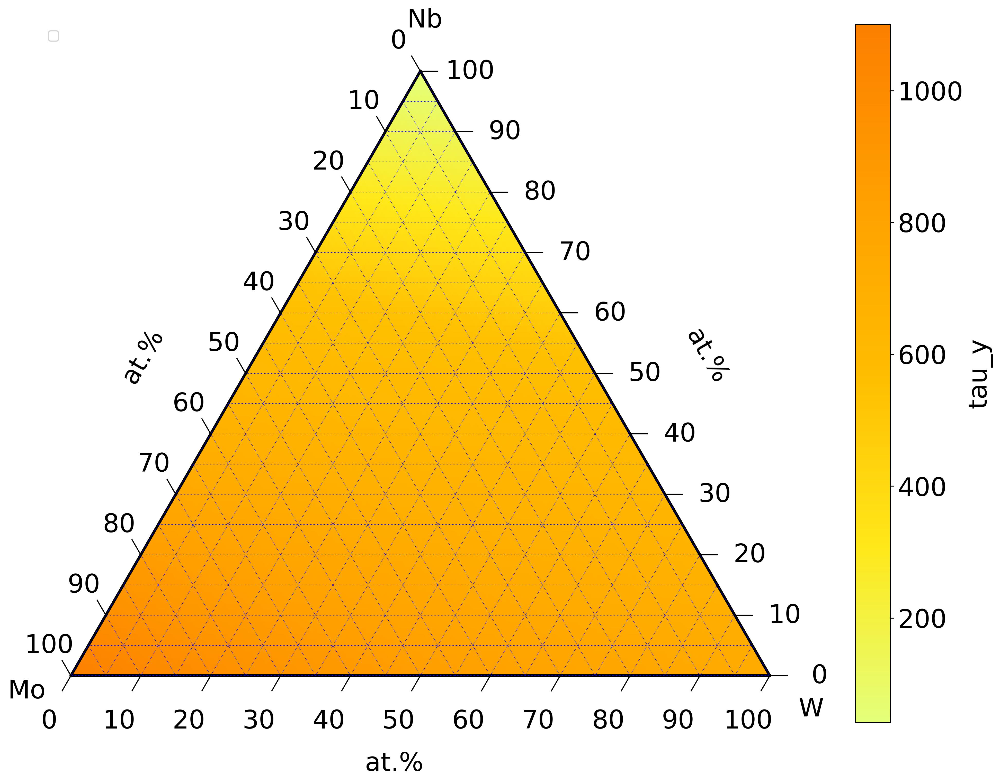

In [14]:
# show figure
plotter.show()

In [15]:
ternary_calc = ternary_calc_strength()

In [16]:
alloy_system2 = {
            "increment": 1,
            "psA": {"grouped_elements":["Ti"],
                    "ratio": [1],
                    "range":[0,100]},
            "psB": {"grouped_elements":["Nb"],
                    "ratio": [1],
                    "range":[0,100]},
            "psC": {"grouped_elements":["Zr"],
                    "ratio": [1], 
                    "range":[0,100]} # 0 to 100 at.%
        }

dict_TiNbZr = {    "elements":{
        "Nb": {"structure":'bcc',"a":3.30,"G":38,"nu":0.40,"Delta_E_p":0.0345,"E_k":0.25,"E_w_i":0.054 ,"E_f_v":2.99,"E_f_si":5.25,"Delta_V_p":0.010},
        "Ti": {"structure":'bcc',"a":3.31,"G":44,"nu":0.32,"Delta_E_p":0.0292,"E_k":0.25,"E_w_i":-0.028,"E_f_v":2.22,"E_f_si":2.4,"Delta_V_p":0.010},
        "Zr": {"structure":'bcc',"a":3.58,"G":33,"nu":0.34,"Delta_E_p":0.1151,"E_k":0.25,"E_w_i":-0.053,"E_f_v":1.80,"E_f_si":3.5,"Delta_V_p":0.010}
    }}

In [17]:
ternary_calc.use_model('BCC_screw_Maresca-Curtin-2019')
ternary_calc.use_model('BCC_screw_Suzuki_RWASM-2020')
ternary_calc.use_model('BCC_edge_Maresca-Curtin-2019')
# specify the adjustable parameters for the model 
ternary_calc.set_adjustables()


Currently using model(s): ['BCC_screw_Maresca-Curtin-2019']
Currently using model(s): ['BCC_screw_Maresca-Curtin-2019', 'BCC_screw_Suzuki_RWASM-2020']
Currently using model(s): ['BCC_screw_Maresca-Curtin-2019', 'BCC_screw_Suzuki_RWASM-2020', 'BCC_edge_Maresca-Curtin-2019']
Setting adjustable parameters of the model BCC_edge_Maresca-Curtin-2019.
{'f1': 0.7844, 'f2': 7.2993, 'alpha': 0.123}
Setting adjustable parameters of the model BCC_screw_Maresca-Curtin-2019.
{'kink_width': 10, 'Delta_V_p_para': 1, 'Delta_E_p_para': 1}
Setting adjustable parameters of the model BCC_screw_Suzuki_RWASM-2020.
{'kink_width': 10, 'tau_i_exponent': 1, 'dislocation_density': 40000000000000.0, 'trial_kappa': {'min': 1, 'max': 4, 'inc': 0.5}, 'trial_tau_k': 5}


In [18]:
ternary_calc.set_comp_mesh(alloy_system2)
ternary_calc.grab_data(from_dict=dict_TiNbZr)

temperature = 1173
ternary_calc.set_temp(temperature)

Alloy system: Ti Nb Zr 
Ternary composition grid generated: 
Vertex: A; Vertex Element: Ti; Composition range: 0-100 at.%
Vertex: B; Vertex Element: Nb; Composition range: 0-100 at.%
Vertex: C; Vertex Element: Zr; Composition range: 0-100 at.%
grab elemental data for prediction.
Setting elemental data of the model BCC_edge_Maresca-Curtin-2019.
Setting elemental data of the model BCC_screw_Maresca-Curtin-2019.
Setting elemental data of the model BCC_screw_Suzuki_RWASM-2020.


In [19]:
ternary_calc.calculate()

Preparing Calculation -> BCC_screw_Maresca-Curtin-2019.
Done Calculation. -> BCC_screw_Maresca-Curtin-2019.
Preparing Calculation -> BCC_screw_Suzuki_RWASM-2020.


/Users/Wendongsheng/project/pySSpredict/pySSpredict/bin/sspredict/make_prediction/models.py:1021: RuntimeWarning: divide by zero encountered in true_divide
  tau_k_trial**2 * self.a_p**3 * self.b**4 * self.lambda_k**2 / (6*kappa_i**2 * self.E_w_i**2 * self.c)
/Users/Wendongsheng/project/pySSpredict/pySSpredict/bin/sspredict/make_prediction/models.py:1023: RuntimeWarning: divide by zero encountered in log
  np.log( (5*np.pi*self.kT)**2 * self.Debye * self.a_p * self.b /((self.G*self.b*self.Delta_V(tau_k_trial,kappa_i))**2 * self.strain_r) )
/Users/Wendongsheng/project/pySSpredict/pySSpredict/bin/sspredict/make_prediction/models.py:1023: RuntimeWarning: invalid value encountered in multiply
  np.log( (5*np.pi*self.kT)**2 * self.Debye * self.a_p * self.b /((self.G*self.b*self.Delta_V(tau_k_trial,kappa_i))**2 * self.strain_r) )
/Users/Wendongsheng/project/pySSpredict/pySSpredict/bin/sspredict/make_prediction/models.py:991: RuntimeWarning: divide by zero encountered in double_scalars
  retu

Done Calculation. -> BCC_screw_Suzuki_RWASM-2020.
Preparing Calculation -> BCC_edge_Maresca-Curtin-2019.


/Users/Wendongsheng/project/pySSpredict/pySSpredict/bin/sspredict/make_prediction/models.py:152: RuntimeWarning: divide by zero encountered in double_scalars
  delta_ss_low_T = self.Ty0 * (1 - ((self.boltzmann_J*self.T)/(self.dEb) * np.log(self.ep0/self.ep))**(2/3) )
/Users/Wendongsheng/project/pySSpredict/pySSpredict/bin/sspredict/make_prediction/models.py:152: RuntimeWarning: invalid value encountered in double_scalars
  delta_ss_low_T = self.Ty0 * (1 - ((self.boltzmann_J*self.T)/(self.dEb) * np.log(self.ep0/self.ep))**(2/3) )
/Users/Wendongsheng/project/pySSpredict/pySSpredict/bin/sspredict/make_prediction/models.py:153: RuntimeWarning: divide by zero encountered in double_scalars
  delta_ss_high_T = self.Ty0 * np.exp(-1/0.55 * self.boltzmann_J*self.T/self.dEb * np.log(self.ep0/self.ep) )


Done Calculation. -> BCC_edge_Maresca-Curtin-2019.


In [20]:
ternary_calc.reorganize_data()


In [21]:
pd_file = 'TiNbZr_TCHEA4_phase_diagram_1169K.json'
with open(pd_file,'r') as fh:
    pd_data = json.load(fh)
#pd_data

In [22]:
# BCC screw suzuki
mask1 = ternary_calc.pretty_calc_data['model']=='BCC_screw_Suzuki_RWASM-2020'
data1 = ternary_calc.pretty_calc_data[mask1]
# BCC screw curtin
mask2 = ternary_calc.pretty_calc_data['model']=='BCC_screw_Maresca-Curtin-2019'
data2 = ternary_calc.pretty_calc_data[mask2]
# BCC edge curtin
mask3 = ternary_calc.pretty_calc_data['model']=='BCC_edge_Maresca-Curtin-2019'
data3 = ternary_calc.pretty_calc_data[mask3]

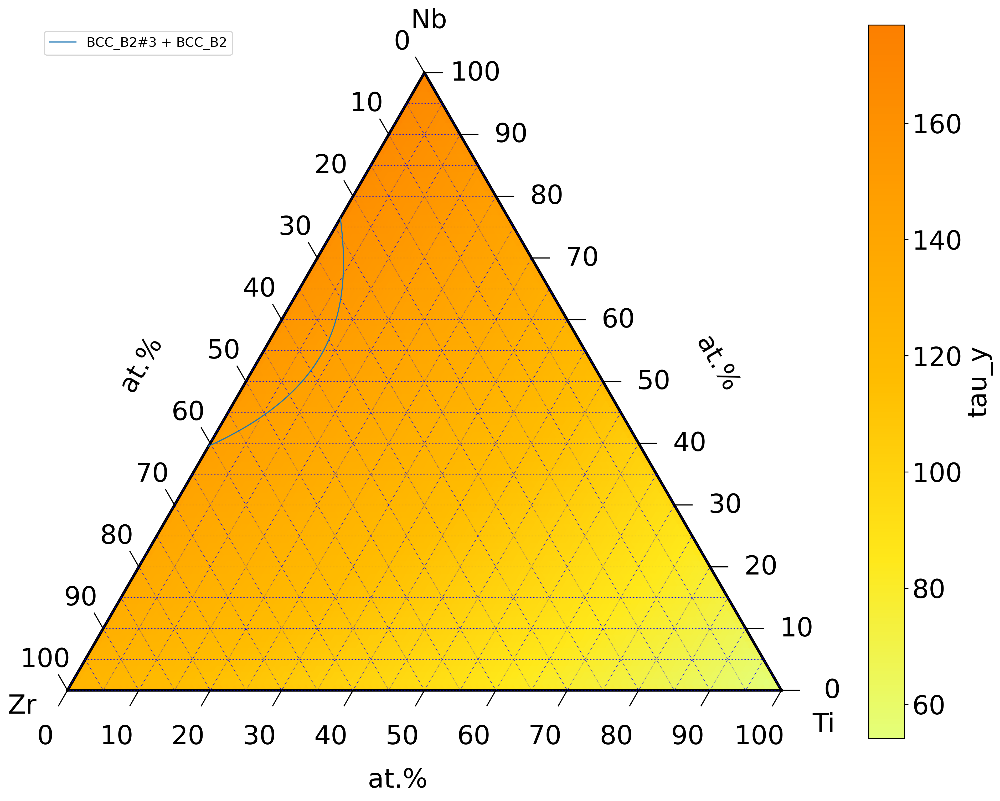

In [23]:
plotter = pyss_plotter_3d(data1,X='Ti',Y='Nb',Z='Zr',H='tau_y',pd_data=pd_data)
plotter.set_axes_labels(left_axis_label='at.%',right_axis_label='at.%',bottom_axis_label='at.%',fontsize=24)
plotter.show()

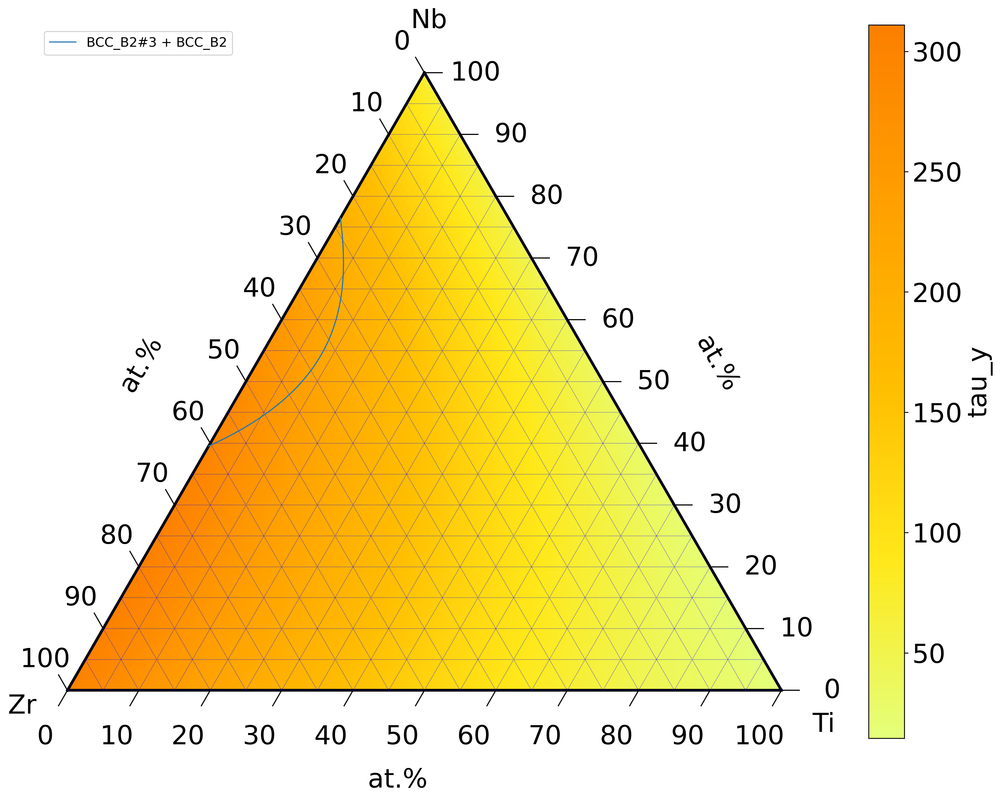

In [24]:
plotter = pyss_plotter_3d(data2,X='Ti',Y='Nb',Z='Zr',H='tau_y',pd_data=pd_data)
plotter.set_axes_labels(left_axis_label='at.%',right_axis_label='at.%',bottom_axis_label='at.%',fontsize=24)
plotter.show()

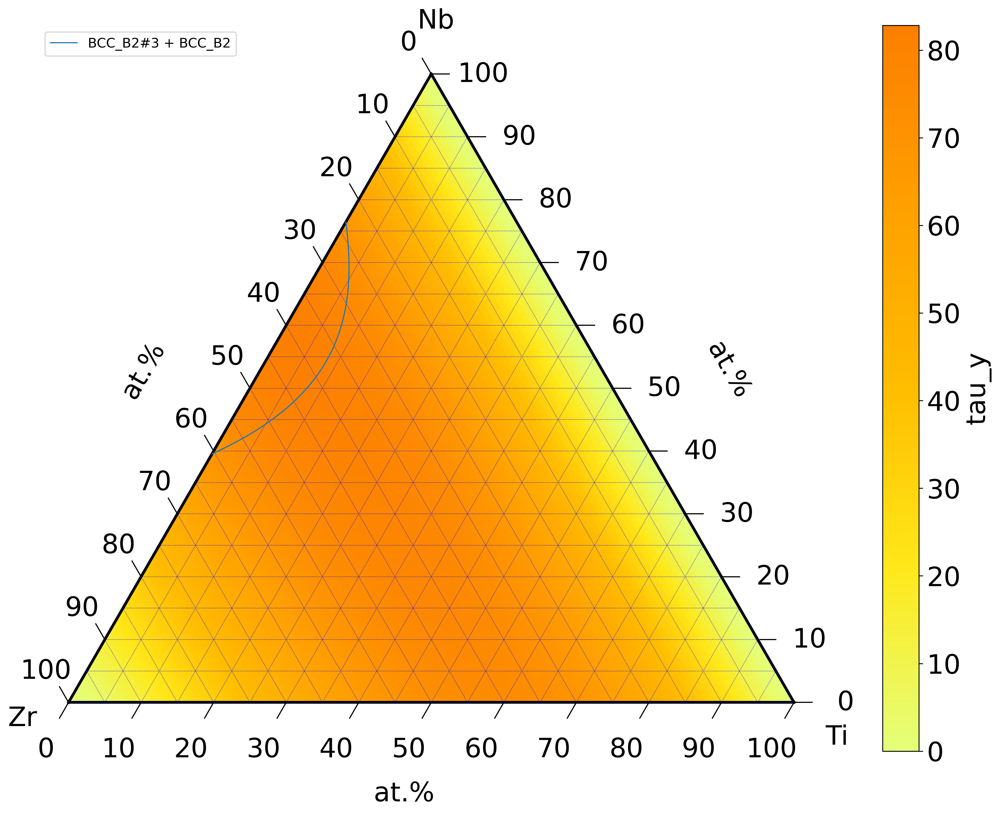

In [25]:
plotter = pyss_plotter_3d(data3,X='Ti',Y='Nb',Z='Zr',H='tau_y',pd_data=pd_data)
plotter.set_axes_labels(left_axis_label='at.%',right_axis_label='at.%',bottom_axis_label='at.%',fontsize=24)
plotter.show()

In [26]:
data1[(data1['Ti']==33)&(data1['Nb']==34)]

,comp(psA),comp(psB),comp(psC),Ti,Nb,Zr,T_liquidus,jog_activated,T,strain_rate,tau_y,structure,model,adjustables
7990,33.0,34.0,33.0,33.0,34.0,33.0,NaN,False,1173.0,0.001,122.55,bcc,BCC_screw_Suzuki_RWASM-2020,"{'kink_width': 10, 'tau_i_exponent': 1, 'dislo..."


In [27]:
data2[(data2['Ti']==50)&(data2['Nb']==25)]

,comp(psA),comp(psB),comp(psC),Ti,Nb,Zr,T_liquidus,jog_activated,T,strain_rate,tau_y,structure,model,adjustables
3850,50.0,25.0,25.0,50.0,25.0,25.0,NaN,NaN,1173.0,0.001,102.65,bcc,BCC_screw_Maresca-Curtin-2019,"{'kink_width': 10, 'Delta_V_p_para': 1, 'Delta..."


In [28]:
data3[(data3['Ti']==33)&(data3['Nb']==33)]

,comp(psA),comp(psB),comp(psC),Ti,Nb,Zr,T_liquidus,jog_activated,T,strain_rate,tau_y,structure,model,adjustables
13140,33.0,33.0,34.0,33.0,33.0,34.0,NaN,NaN,1173.0,0.001,76.81,bcc,BCC_edge_Maresca-Curtin-2019,"{'f1': 0.7844, 'f2': 7.2993, 'alpha': 0.123}"


In [29]:
data3[data3['tau_y']==data3['tau_y'].max()]

,comp(psA),comp(psB),comp(psC),Ti,Nb,Zr,T_liquidus,jog_activated,T,strain_rate,tau_y,structure,model,adjustables
10361,0.0,59.0,41.0,0.0,59.0,41.0,NaN,NaN,1173.0,0.001,82.83,bcc,BCC_edge_Maresca-Curtin-2019,"{'f1': 0.7844, 'f2': 7.2993, 'alpha': 0.123}"


In [30]:
data1[data1['tau_y']==data1['tau_y'].max()]

,comp(psA),comp(psB),comp(psC),Ti,Nb,Zr,T_liquidus,jog_activated,T,strain_rate,tau_y,structure,model,adjustables
5251,0.0,100.0,0.0,0.0,100.0,0.0,NaN,False,1173.0,0.001,176.93,bcc,BCC_screw_Suzuki_RWASM-2020,"{'kink_width': 10, 'tau_i_exponent': 1, 'dislo..."


In [31]:
data2[data2['tau_y']==data2['tau_y'].max()]

,comp(psA),comp(psB),comp(psC),Ti,Nb,Zr,T_liquidus,jog_activated,T,strain_rate,tau_y,structure,model,adjustables
18,0.0,18.0,82.0,0.0,18.0,82.0,NaN,NaN,1173.0,0.001,311.01,bcc,BCC_screw_Maresca-Curtin-2019,"{'kink_width': 10, 'Delta_V_p_para': 1, 'Delta..."


In [32]:
data1_set = data1.reset_index()
data2_set = data2.reset_index()
data3_set = data3.reset_index()

In [33]:
combine_data = pd.DataFrame(data={
    'Ti': data1_set['Ti'].values,
    'Nb': data1_set['Nb'].values,
    'Zr': data1_set['Zr'].values,
    'tau_y_1':data1_set['tau_y'].values,
    'tau_y_2':data2_set['tau_y'].values,
    'tau_y_3':data3_set['tau_y'].values
})

In [34]:
conditions = [
    (combine_data['tau_y_1'] >= combine_data['tau_y_2']) & (combine_data['tau_y_1'] >= combine_data['tau_y_3']), 
    (combine_data['tau_y_2'] >= combine_data['tau_y_1']) & (combine_data['tau_y_2'] >= combine_data['tau_y_3']), 
    (combine_data['tau_y_3'] >= combine_data['tau_y_2']) & (combine_data['tau_y_3'] >= combine_data['tau_y_1'])
]

choices = [combine_data['tau_y_1'],combine_data['tau_y_2'],combine_data['tau_y_3']]
models = [1,2,3]
combine_data['tau_y_max'] = np.select(conditions, choices, default=np.nan)
combine_data['model'] = np.select(conditions, models, default=np.nan)

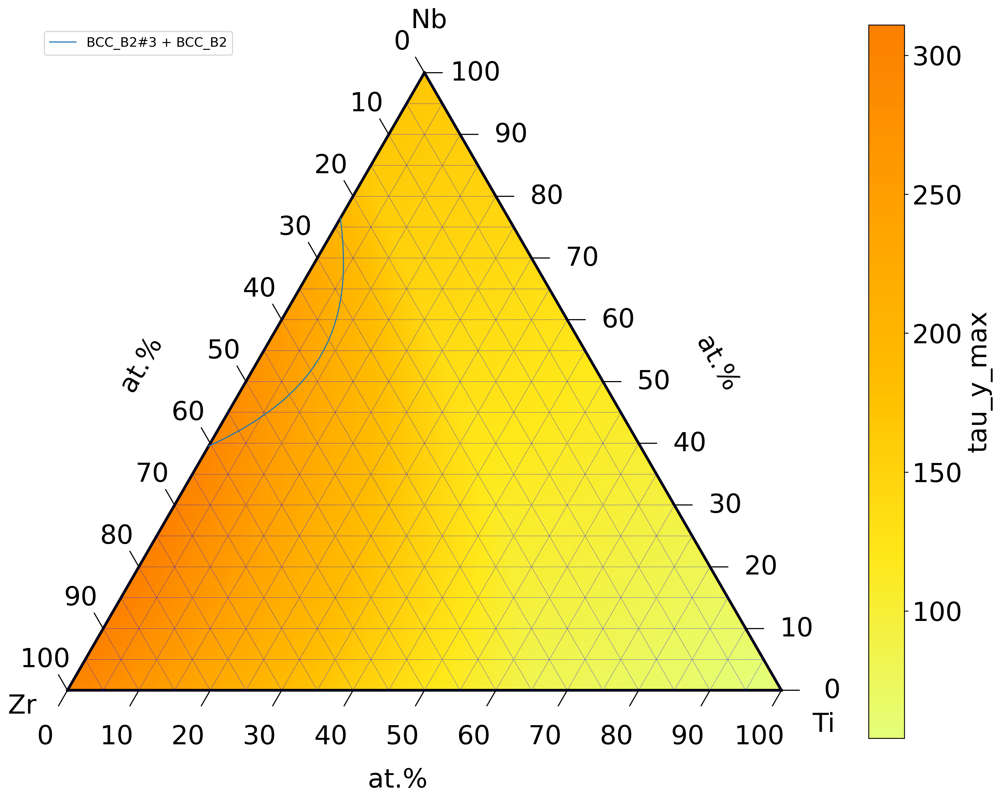

In [35]:
plotter = pyss_plotter_3d(combine_data,X='Ti',Y='Nb',Z='Zr',H='tau_y_max',pd_data=pd_data)
plotter.set_axes_labels(left_axis_label='at.%',right_axis_label='at.%',bottom_axis_label='at.%',fontsize=24)
plotter.show()

In [36]:
mask_models = combine_data['model']==1
points_1 = list(zip(combine_data[mask_models]['Ti'].values,combine_data[mask_models]['Nb'].values))


In [37]:
import alphashape


In [38]:
hull = alphashape.alphashape(points_1, 1)
hull_pts = hull.exterior.coords.xy

In [39]:
boundary_points = list(zip(hull_pts[0],hull_pts[1]))

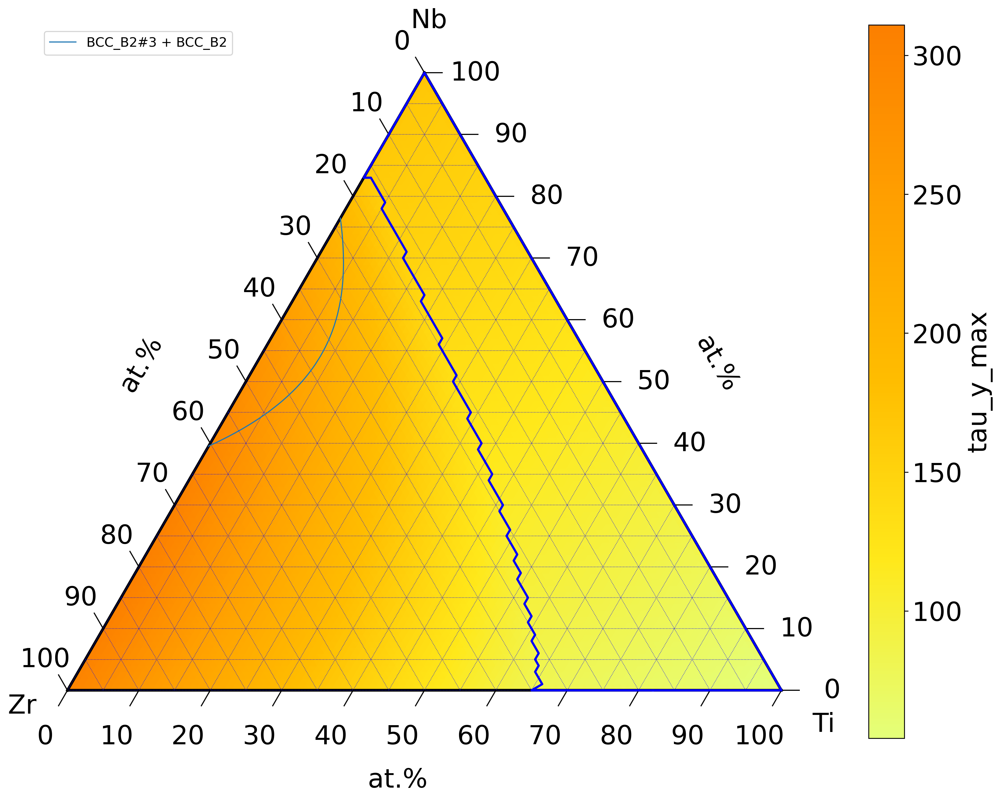

In [40]:
plotter = pyss_plotter_3d(combine_data,X='Ti',Y='Nb',Z='Zr',H='tau_y_max',pd_data=pd_data)
plotter.set_axes_labels(left_axis_label='at.%',right_axis_label='at.%',bottom_axis_label='at.%',fontsize=24)
plotter.tax.plot(boundary_points,color='b',lw=2)
plotter.show()